# K-Means Clustering - EsSalud Lab Data


In [1]:
import sys

sys.path.append("../")

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from src import (
    apply_outlier_trimming,
    calculate_cluster_metrics,
    create_department_choropleth,
    create_ml_features,
    extract_procedure_values,
    load_geojson,
    normalize_features,
    plot_3d_clusters,
    plot_cluster_map,
    plot_cluster_metrics,
    plot_cluster_scatterplots,
    train_kmeans_range,
)

sns.set_style("darkgrid")
pd.options.display.max_columns = None
%matplotlib inline

In [ ]:
import os

os.makedirs("../images", exist_ok=True)

## Data Loading


In [ ]:
df_raw = pd.read_csv("../data/dataset_202001_202404_training.csv", delimiter=";")

In [ ]:
ubigeo_df = pd.read_csv("../data/ubigeo_distrito.csv")[
    ["inei", "latitude", "longitude"]
]
df_raw = df_raw.merge(ubigeo_df, left_on="UBIGEO", right_on="inei", how="left").drop(
    columns=["inei"]
)

In [ ]:
relevant_cols = [
    "UBIGEO",
    "EDAD_PACIENTE",
    "SEXO_PACIENTE",
    "PROCEDIMIENTO_1",
    "RESULTADO_1",
    "PROCEDIMIENTO_2",
    "RESULTADO_2",
    "latitude",
    "longitude",
]
df = df_raw[relevant_cols].copy()
df.columns = df.columns.str.lower()

In [ ]:
TRI = "TRIGLICERIDOS"
GLU = "DOSAJE DE GLUCOSA EN SANGRE, CUANTITATIVO (EXCEPTO CINTA REACTIVA)"
df = extract_procedure_values(df, TRI, GLU)

## EDA


In [ ]:
df[["tri", "glu", "edad_paciente"]].describe()

,tri,glu,edad_paciente
count,294971.000000,294971.000000,294971.000000
mean,161.270079,102.267755,47.651183
std,94.352966,34.884152,21.695729
min,0.000000,0.030000,0.000000
25%,101.000000,88.200000,34.000000
50%,141.000000,96.000000,52.000000
75%,198.000000,106.000000,64.000000
max,1000.000000,979.000000,103.000000


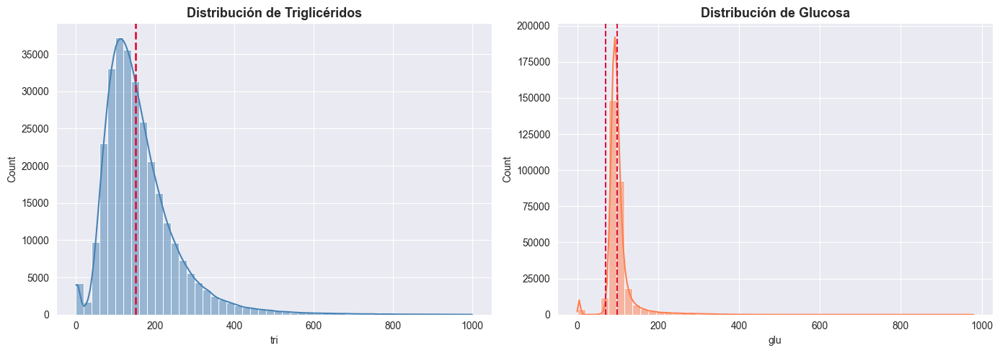

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.histplot(df["tri"], bins=50, kde=True, color="steelblue", ax=axes[0])
axes[0].axvline(150, color="crimson", linestyle="--", linewidth=2)
axes[0].set_title("Distribución de Triglicéridos", fontsize=13, fontweight="bold")

sns.histplot(df["glu"], bins=50, kde=True, color="coral", ax=axes[1])
axes[1].axvline(70, color="crimson", linestyle="--", linewidth=1.5)
axes[1].axvline(99, color="crimson", linestyle="--", linewidth=1.5)
axes[1].set_title("Distribución de Glucosa", fontsize=13, fontweight="bold")

plt.tight_layout()
plt.show()

## Geographic Visualization


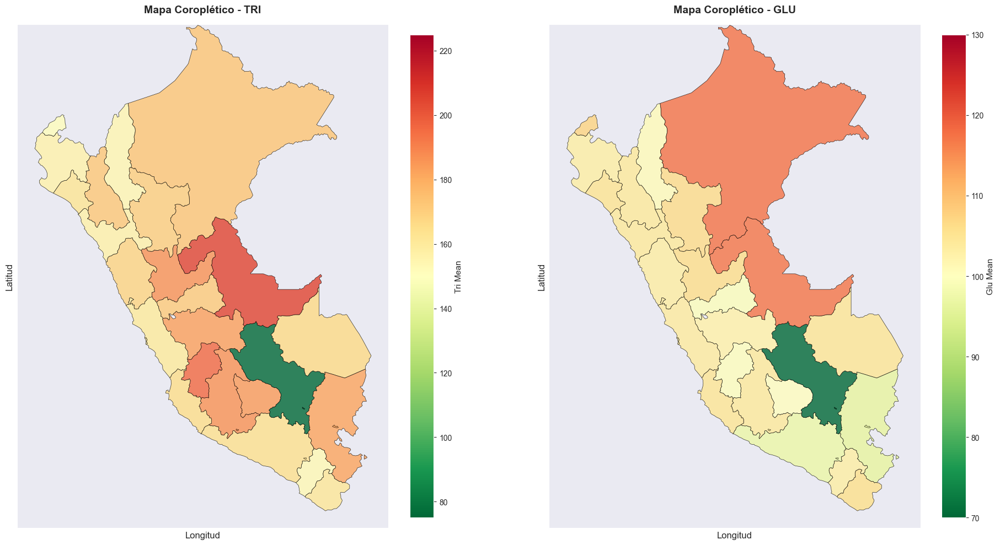

In [ ]:
fig, axes, dept_stats = create_department_choropleth(
    df,
    geojson_path="../data/peru_departamental.geojson",
    value_cols=["tri", "glu"],
    figsize=(20, 10),
)
plt.savefig("../images/choropleth_departments.png", dpi=150, bbox_inches="tight")
plt.show()

In [ ]:
df_clean = apply_outlier_trimming(df, ["tri", "glu"], [1.5, 2.5])

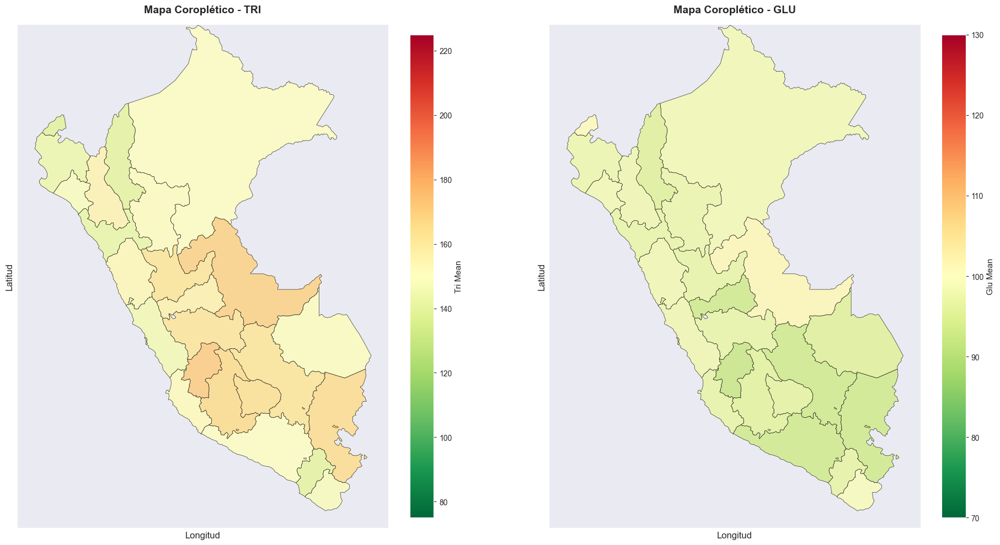

In [ ]:
fig, axes, dept_stats = create_department_choropleth(
    df_clean,
    geojson_path="../data/peru_departamental.geojson",
    value_cols=["tri", "glu"],
    figsize=(20, 10),
)
plt.show()

## K-Means: Análisis 5D (Triglicéridos + Glucosa + Edad + Ubicación)

Variables: `tri`, `glu`, `edad_paciente`, `latitude`, `longitude`  
K evaluados: 2, 3, 4, 5


In [ ]:
df_ml, numeric_features = create_ml_features(
    df,
    ["tri", "glu", "ubigeo", "sexo_paciente", "edad_paciente", "latitude", "longitude"],
    encode_categorical=True,
)

In [ ]:
feature_cols = ["tri", "glu", "edad_paciente", "latitude", "longitude"]
X = df_ml[feature_cols]
X_norm = normalize_features(X)

In [ ]:
K_range = range(2, 10)
fits = train_kmeans_range(X_norm, K_range)
geojson_data = load_geojson("../data/peru_departamental.geojson")

In [ ]:
db_scores, ch_scores, wcss, best_k_db, best_k_ch = calculate_cluster_metrics(
    X_norm, fits, K_range
)
print(f"Mejor K por Davies-Bouldin: {best_k_db}")
print(f"Mejor K por Calinski-Harabasz: {best_k_ch}")
print(
    f"Método del codo (WCSS): K=4-5 (determinado por inspección visual de la gráfica)"
)

Mejor K por Davies-Bouldin: 8
Mejor K por Calinski-Harabasz: 2
Método del codo (WCSS): K=4-5 (determinado por inspección visual de la gráfica)


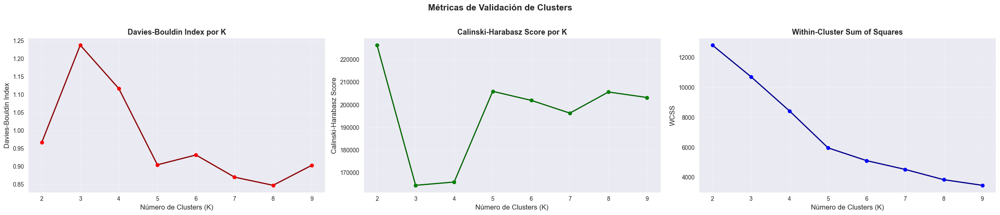

In [ ]:
fig, axes = plot_cluster_metrics(K_range, db_scores, ch_scores, wcss)
plt.savefig("../images/metrics_validation_5d.png", dpi=150, bbox_inches="tight")
plt.show()

## Cluster Visualization


/Users/oscar/Projects/lab_delay_prediction_essalud/nb/../src/geo_viz_clusters.py:24: UserWarning: The markers list has more values (5) than needed (2), which may not be intended.
  sns.scatterplot(
/Users/oscar/Projects/lab_delay_prediction_essalud/nb/../src/geo_viz_clusters.py:24: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.scatterplot(
/Users/oscar/Projects/lab_delay_prediction_essalud/nb/../src/geo_viz_clusters.py:24: UserWarning: The markers list has more values (5) than needed (4), which may not be intended.
  sns.scatterplot(
/Users/oscar/Projects/lab_delay_prediction_essalud/nb/../src/geo_viz_clusters.py:24: UserWarning: 
The markers list has fewer values (5) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(
/Users/oscar/Projects/lab_delay_prediction_essalud/nb/../src/geo_viz_clusters.py:24: UserWarning: 
The markers list has fewer values (5) than needed (7) and will cycle, which 

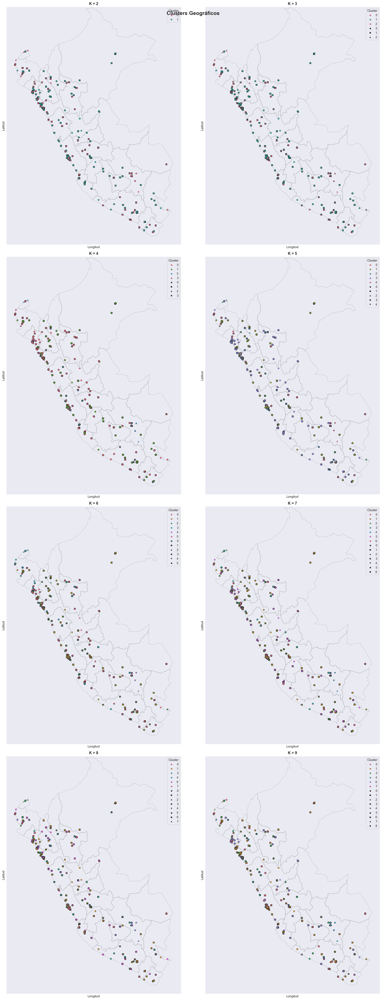

In [ ]:
import math

cols = 2
rows = math.ceil(len(fits) / cols)
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 12))
axes = axes.flatten()

for i, (k, model_fit) in enumerate(zip(K_range, fits)):
    df_temp = df_ml.copy()
    df_temp["cluster"] = model_fit.labels_
    plot_cluster_map(
        ax=axes[i],
        df=df_temp,
        cluster_col="cluster",
        geojson_data=geojson_data,
        title=f"K = {k}",
        s=20,
        alpha=1,
        palette="husl",
    )

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Clusters Geográficos", fontsize=18, fontweight="bold")
plt.tight_layout()
plt.savefig("../images/clusters_geographic_5d.png", dpi=150, bbox_inches="tight")
plt.show()

## Clinical Space Visualization


/Users/oscar/Projects/lab_delay_prediction_essalud/nb/../src/clustering.py:230: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/mz/b6lwmlfj19gcspllhsmfz0b40000gn/T/ipykernel_46383/2164171709.py:37: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  plt.savefig("../images/clusters_clinical_space_5d.png", dpi=150, bbox_inches="tight")
/Users/oscar/Projects/lab_delay_prediction_essalud/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


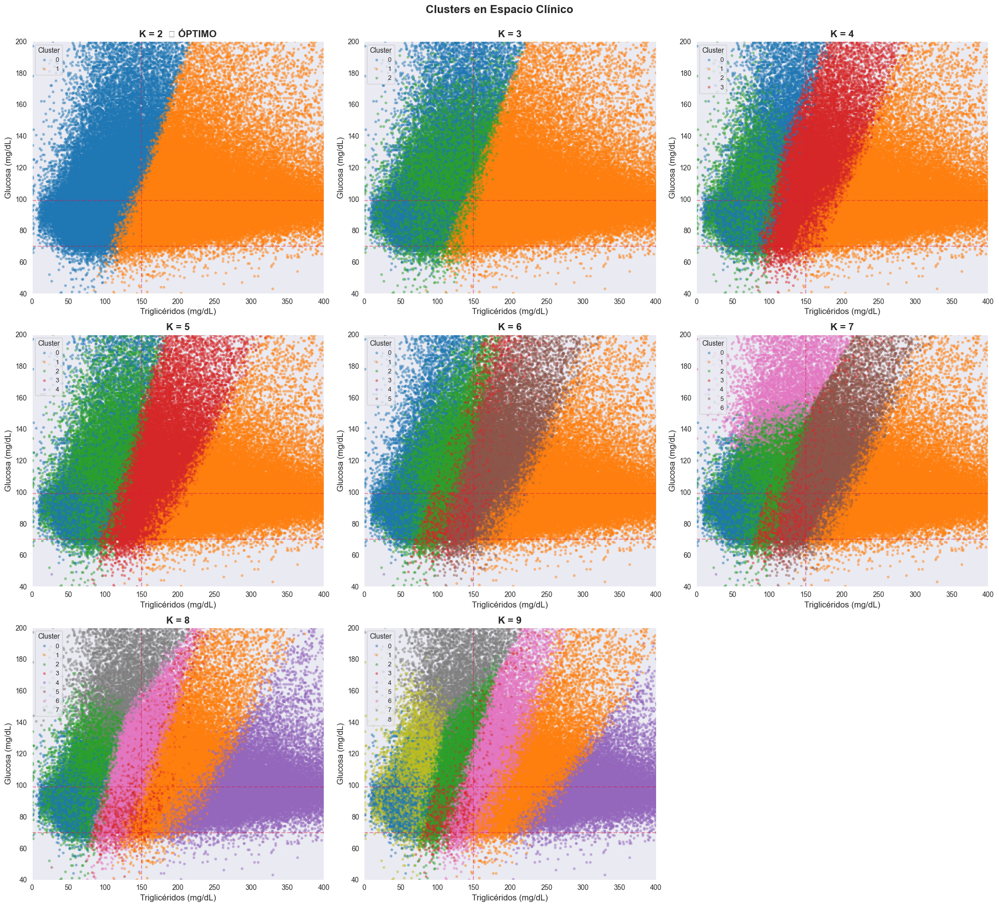

In [ ]:
fig, axes = plot_cluster_scatterplots(
    df=df_ml,
    fits=fits,
    K_range=K_range,
    x_col="tri",
    y_col="glu",
    best_k=best_k_ch,
    x_label="Triglicéridos (mg/dL)",
    y_label="Glucosa (mg/dL)",
    title="Clusters en Espacio Clínico",
    x_lim=(0, 400),
    y_lim=(40, 200),
    vertical_thresholds=[
        {
            "value": 150,
            "color": "crimson",
            "alpha": 0.4,
            "label": "Triglicéridos límite",
        }
    ],
    clinical_thresholds=[
        {
            "value": 70,
            "color": "crimson",
            "alpha": 0.4,
            "label": "Glucosa límite inferior",
        },
        {
            "value": 99,
            "color": "crimson",
            "alpha": 0.4,
            "label": "Glucosa límite superior",
        },
    ],
    s=15,
)
plt.savefig("../images/clusters_clinical_space_5d.png", dpi=150, bbox_inches="tight")
plt.show()

## Cluster Characterization


In [ ]:
optimal_k = 4
model_optimal = fits[2]

df_analysis = df_ml[["tri", "glu", "edad_paciente"]].copy()
df_analysis["cluster"] = model_optimal.labels_

cluster_stats = (
    df_analysis.groupby("cluster")
    .agg(
        {
            "tri": ["mean", "std", "median"],
            "glu": ["mean", "std", "median"],
            "edad_paciente": ["mean", "std", "median"],
        }
    )
    .round(2)
)

print(f"Características de los {optimal_k} clusters:")
print(cluster_stats)

Características de los 4 clusters:
            tri                    glu               edad_paciente         \
           mean     std median    mean    std median          mean    std   
cluster                                                                     
0         91.20   34.55   88.0  114.97  57.89  94.68         26.39  19.24   
1        265.39  101.47  237.0  100.48  25.51  96.00         45.61  19.95   
2         72.72   29.36   80.0   88.45  30.80  94.00         63.89  13.91   
3        145.56   31.78  141.0  102.59  25.35  97.00         53.10  18.46   

                
        median  
cluster         
0         16.0  
1         49.0  
2         65.0  
3         56.0  


/var/folders/mz/b6lwmlfj19gcspllhsmfz0b40000gn/T/ipykernel_46383/905251541.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_analysis, x="cluster", y="tri", palette="tab10", ax=axes[0])
/var/folders/mz/b6lwmlfj19gcspllhsmfz0b40000gn/T/ipykernel_46383/905251541.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_analysis, x="cluster", y="glu", palette="tab10", ax=axes[1])
/var/folders/mz/b6lwmlfj19gcspllhsmfz0b40000gn/T/ipykernel_46383/905251541.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


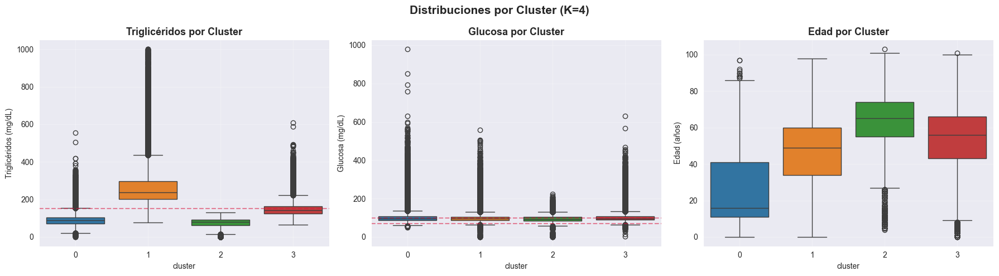

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.boxplot(data=df_analysis, x="cluster", y="tri", palette="tab10", ax=axes[0])
axes[0].axhline(150, color="crimson", linestyle="--", linewidth=1.5, alpha=0.5)
axes[0].set_title("Triglicéridos por Cluster", fontsize=13, fontweight="bold")
axes[0].set_ylabel("Triglicéridos (mg/dL)")
axes[0].grid(True, alpha=0.3)

sns.boxplot(data=df_analysis, x="cluster", y="glu", palette="tab10", ax=axes[1])
axes[1].axhline(70, color="crimson", linestyle="--", linewidth=1.5, alpha=0.5)
axes[1].axhline(99, color="crimson", linestyle="--", linewidth=1.5, alpha=0.5)
axes[1].set_title("Glucosa por Cluster", fontsize=13, fontweight="bold")
axes[1].set_ylabel("Glucosa (mg/dL)")
axes[1].grid(True, alpha=0.3)

sns.boxplot(
    data=df_analysis, x="cluster", y="edad_paciente", palette="tab10", ax=axes[2]
)
axes[2].set_title("Edad por Cluster", fontsize=13, fontweight="bold")
axes[2].set_ylabel("Edad (años)")
axes[2].grid(True, alpha=0.3)

plt.suptitle(
    f"Distribuciones por Cluster (K={optimal_k})", fontsize=15, fontweight="bold"
)
plt.tight_layout()
plt.savefig("../images/clusters_boxplots_5d.png", dpi=150, bbox_inches="tight")
plt.show()

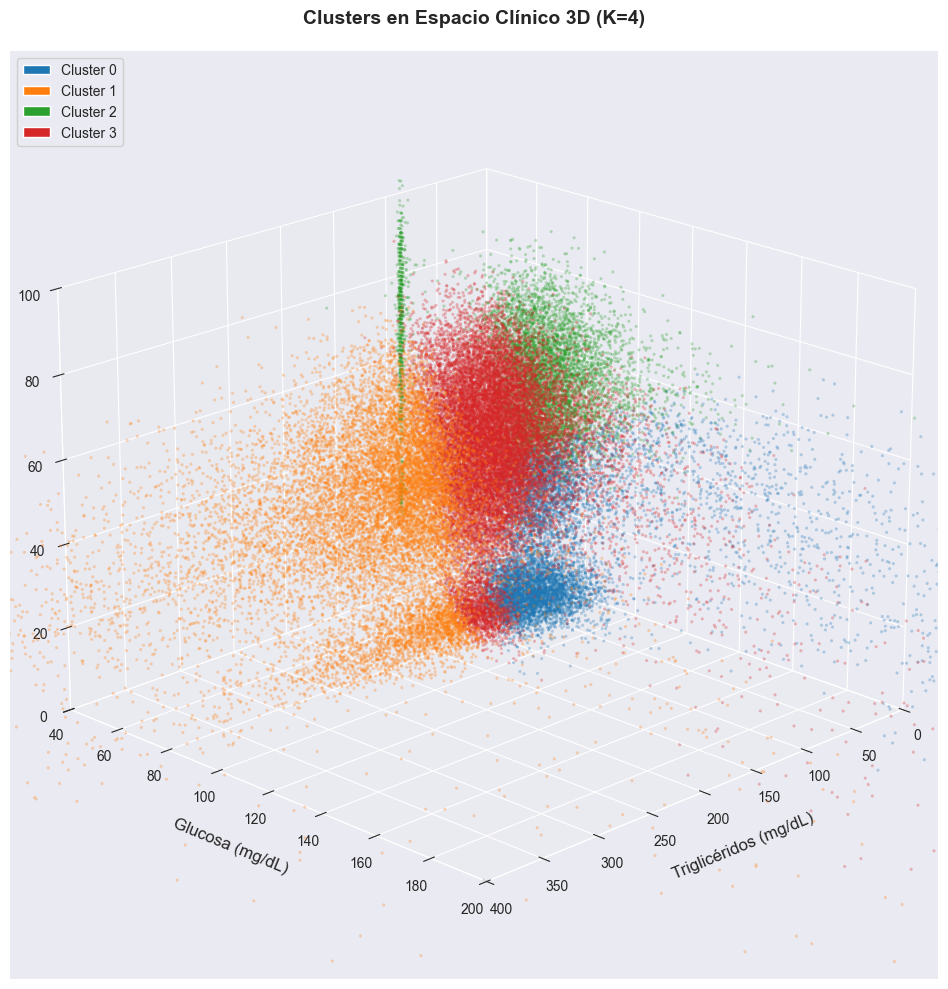

In [ ]:
fig, ax = plot_3d_clusters(
    df=df_analysis,
    cluster_col="cluster",
    x_col="tri",
    y_col="glu",
    z_col="edad_paciente",
    x_label="Triglicéridos (mg/dL)",
    y_label="Glucosa (mg/dL)",
    z_label="Edad (años)",
    title=f"Clusters en Espacio Clínico 3D (K={optimal_k})",
    x_lim=(0, 400),
    y_lim=(40, 200),
    z_lim=(0, 100),
    sample_n=50000,
    alpha=0.3,
    s=5,
)
plt.savefig("../images/clusters_3d.png", dpi=150, bbox_inches="tight")
plt.show()

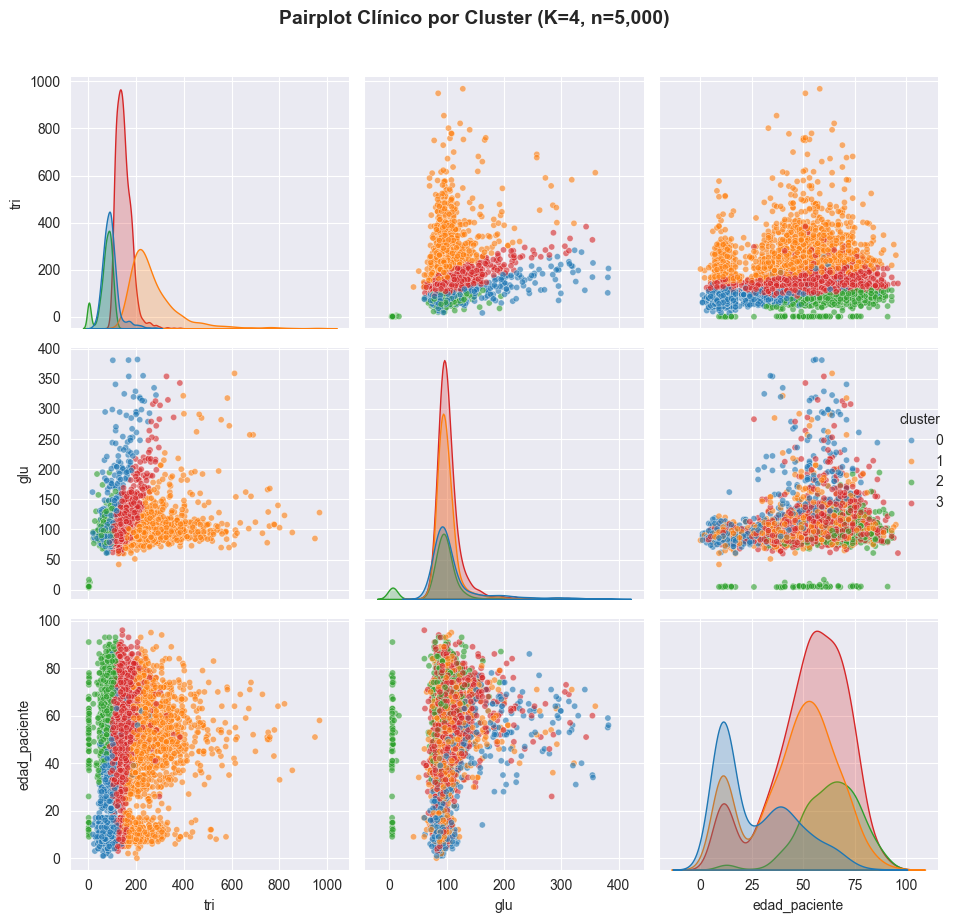

In [ ]:
df_sample = df_analysis.sample(n=5000, random_state=42)

pairplot = sns.pairplot(
    df_sample,
    hue="cluster",
    palette="tab10",
    diag_kind="kde",
    plot_kws={"alpha": 0.6, "s": 20},
    height=3,
)

pairplot.figure.suptitle(
    f"Pairplot Clínico por Cluster (K={optimal_k}, n=5,000)",
    y=1.02,
    fontsize=14,
    fontweight="bold",
)

plt.tight_layout()
plt.savefig("../images/clusters_pairplot_5d.png", dpi=150, bbox_inches="tight")
plt.show()

## K-Means: Edad vs Glucosa (Análisis 2D)

Variables: `edad_paciente`, `glu`  
K evaluados: 2, 3, 4, 5, 6, 7, 8


In [ ]:
from sklearn.cluster import KMeans

feature_cols_age_glu = ["edad_paciente", "glu"]
X_age_glu = df_ml[feature_cols_age_glu].copy()
X_age_glu_norm = normalize_features(X_age_glu)

K_range_age_glu = range(2, 9)
fits_age_glu = []

for k in K_range_age_glu:
    model = KMeans(n_clusters=k, random_state=0, n_init="auto")
    model.fit(X_age_glu_norm)
    fits_age_glu.append(model)

print(f"✓ K-means entrenado para K={list(K_range_age_glu)}")

✓ K-means entrenado para K=[2, 3, 4, 5, 6, 7, 8]


In [ ]:
(
    db_scores_age_glu,
    ch_scores_age_glu,
    wcss_age_glu,
    best_k_db_glu,
    best_k_ch_glu,
) = calculate_cluster_metrics(X_age_glu_norm, fits_age_glu, K_range_age_glu)

print(f"Mejor K por Davies-Bouldin: {best_k_db_glu}")
print(f"Mejor K por Calinski-Harabasz: {best_k_ch_glu}")
print("Método del codo (WCSS): K=4 (determinado por inspección visual de la gráfica)")

Mejor K por Davies-Bouldin: 4
Mejor K por Calinski-Harabasz: 8
Método del codo (WCSS): K=4 (determinado por inspección visual de la gráfica)


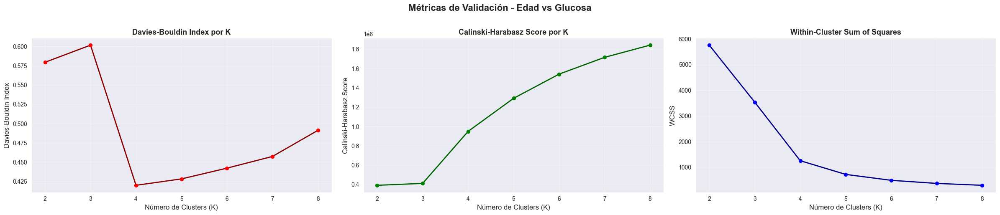

In [ ]:
fig, axes = plot_cluster_metrics(
    K_range_age_glu, db_scores_age_glu, ch_scores_age_glu, wcss_age_glu
)
plt.suptitle(
    "Métricas de Validación - Edad vs Glucosa", fontsize=16, fontweight="bold", y=1.02
)
plt.savefig("../images/metrics_validation_age_glu.png", dpi=150, bbox_inches="tight")
plt.show()

/Users/oscar/Projects/lab_delay_prediction_essalud/nb/../src/clustering.py:230: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/mz/b6lwmlfj19gcspllhsmfz0b40000gn/T/ipykernel_46383/589236156.py:19: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  plt.savefig("../images/clusters_age_glucose.png", dpi=150, bbox_inches="tight")
/Users/oscar/Projects/lab_delay_prediction_essalud/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


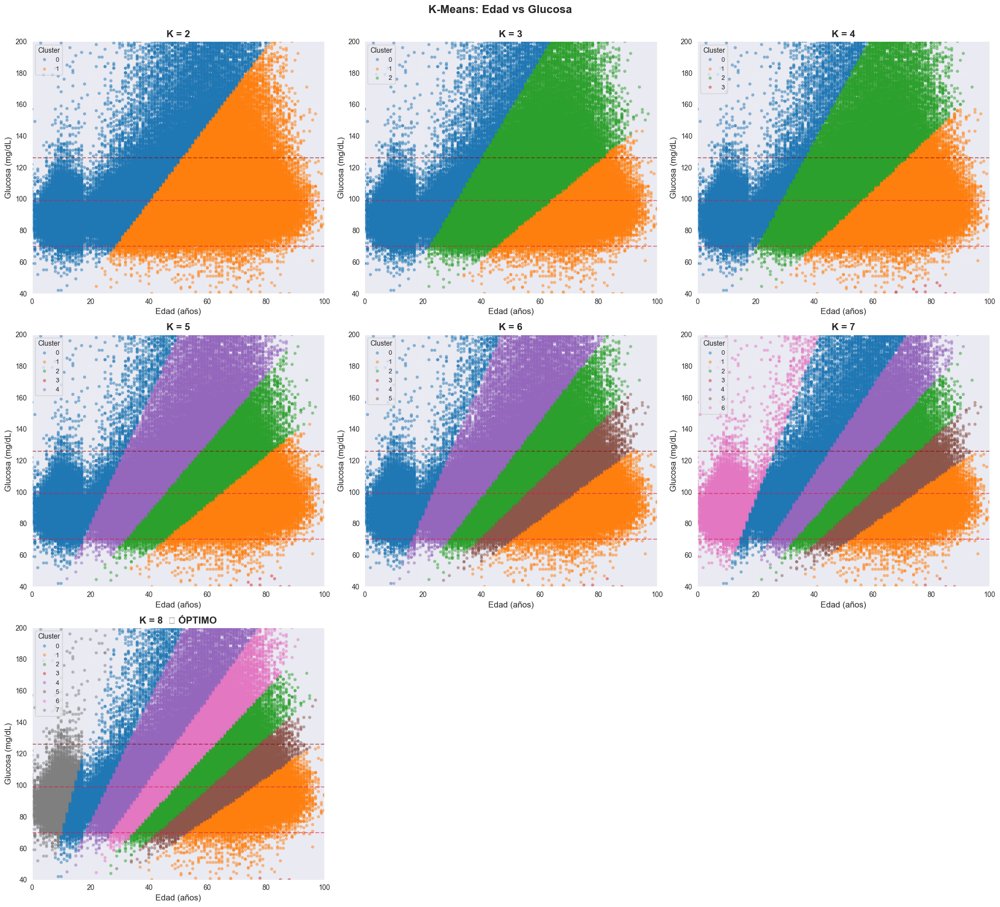

In [ ]:
fig, axes = plot_cluster_scatterplots(
    df=df_ml,
    fits=fits_age_glu,
    K_range=K_range_age_glu,
    x_col="edad_paciente",
    y_col="glu",
    best_k=best_k_ch_glu,
    x_label="Edad (años)",
    y_label="Glucosa (mg/dL)",
    title="K-Means: Edad vs Glucosa",
    x_lim=(0, 100),
    y_lim=(40, 200),
    clinical_thresholds=[
        {"value": 70, "color": "crimson", "alpha": 0.5, "label": "Límite inferior"},
        {"value": 99, "color": "crimson", "alpha": 0.5, "label": "Límite superior"},
        {"value": 126, "color": "darkred", "alpha": 0.5, "label": "Diabetes"},
    ],
)
plt.savefig("../images/clusters_age_glucose.png", dpi=150, bbox_inches="tight")
plt.show()

In [ ]:
optimal_k_age_glu = best_k_ch_glu
model_optimal_age_tri = fits_age_glu[best_k_ch_glu - 2]

df_age_glu_analysis = df_ml[["edad_paciente", "glu"]].copy()
df_age_glu_analysis["cluster"] = model_optimal_age_tri.labels_

cluster_stats_age_glu = (
    df_age_glu_analysis.groupby("cluster")
    .agg({"edad_paciente": ["mean", "std", "count"], "glu": ["mean", "std"]})
    .round(2)
)

print(f"Características de los {optimal_k_age_glu} clusters (Edad-Glucosa):")
print(cluster_stats_age_glu)
print("\n" + "=" * 60)

for cluster_id in sorted(df_age_glu_analysis["cluster"].unique()):
    cluster_data = df_age_glu_analysis[df_age_glu_analysis["cluster"] == cluster_id]
    edad_mean = cluster_data["edad_paciente"].mean()
    glu_mean = cluster_data["glu"].mean()
    n = len(cluster_data)

    if glu_mean < 70:
        glu_status = "bajo"
    elif glu_mean < 100:
        glu_status = "normal"
    elif glu_mean < 126:
        glu_status = "prediabetes"
    else:
        glu_status = "diabetes"

    print(f"\nCluster {cluster_id} (n={n:,}):")
    print(f"  - Edad promedio: {edad_mean:.1f} años")
    print(f"  - Glucosa promedio: {glu_mean:.1f} mg/dL ({glu_status})")

Características de los 8 clusters (Edad-Glucosa):
        edad_paciente                   glu       
                 mean    std  count    mean    std
cluster                                           
0               24.78  16.27  22022  127.77  77.07
1               75.62   8.47  26349   88.28  10.40
2               56.13   8.21  63387  101.02  14.06
3               52.68  18.38   3790    5.57   2.21
4               38.91  12.31  34258  117.28  38.77
5               65.87   7.43  53501   96.47  10.23
6               47.36   9.64  52840  106.24  21.25
7               10.31   5.60  38824   98.10  41.15


Cluster 0 (n=22,022):
  - Edad promedio: 24.8 años
  - Glucosa promedio: 127.8 mg/dL (diabetes)

Cluster 1 (n=26,349):
  - Edad promedio: 75.6 años
  - Glucosa promedio: 88.3 mg/dL (normal)

Cluster 2 (n=63,387):
  - Edad promedio: 56.1 años
  - Glucosa promedio: 101.0 mg/dL (prediabetes)

Cluster 3 (n=3,790):
  - Edad promedio: 52.7 años
  - Glucosa promedio: 5.6 mg/dL (bajo)

Cluste

## K-Means: Edad vs Triglicéridos (Análisis 2D)

Variables: `edad_paciente`, `tri`  
K evaluados: 2, 3, 4, 5, 6, 7, 8


In [ ]:
from sklearn.cluster import KMeans

feature_cols_age_tri = ["edad_paciente", "tri"]
X_age_tri = df_ml[feature_cols_age_tri].copy()
X_age_tri_norm = normalize_features(X_age_tri)

K_range_age_tri = range(2, 9)
fits_age_tri = []

for k in K_range_age_tri:
    model = KMeans(n_clusters=k, random_state=0, n_init="auto")
    model.fit(X_age_tri_norm)
    fits_age_tri.append(model)

print(f"✓ K-means entrenado para K={list(K_range_age_tri)}")

✓ K-means entrenado para K=[2, 3, 4, 5, 6, 7, 8]


In [ ]:
(
    db_scores_age_tri,
    ch_scores_age_tri,
    wcss_age_tri,
    best_k_db_tri,
    best_k_ch_tri,
) = calculate_cluster_metrics(X_age_tri_norm, fits_age_tri, K_range_age_tri)

print(f"Mejor K por Davies-Bouldin: {best_k_db_tri}")
print(f"Mejor K por Calinski-Harabasz: {best_k_ch_tri}")
print(f"Método del codo (WCSS): K=3 (determinado por inspección visual de la gráfica)")

Mejor K por Davies-Bouldin: 5
Mejor K por Calinski-Harabasz: 8
Método del codo (WCSS): K=3 (determinado por inspección visual de la gráfica)


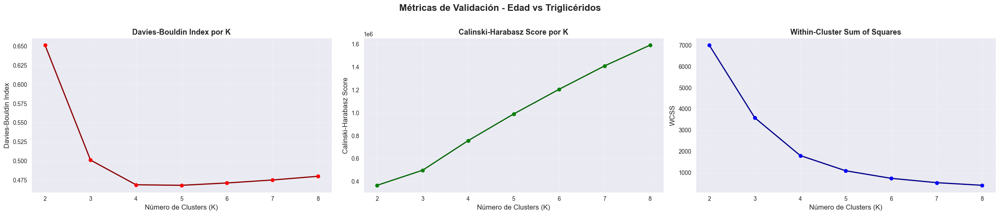

In [ ]:
fig, axes = plot_cluster_metrics(
    K_range_age_tri, db_scores_age_tri, ch_scores_age_tri, wcss_age_tri
)
plt.suptitle(
    "Métricas de Validación - Edad vs Triglicéridos",
    fontsize=16,
    fontweight="bold",
    y=1.02,
)
plt.savefig("../images/metrics_validation_age_tri.png", dpi=150, bbox_inches="tight")
plt.show()

/Users/oscar/Projects/lab_delay_prediction_essalud/nb/../src/clustering.py:230: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/mz/b6lwmlfj19gcspllhsmfz0b40000gn/T/ipykernel_46383/3439970751.py:19: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  plt.savefig("../images/clusters_age_triglycerides.png", dpi=150, bbox_inches="tight")
/Users/oscar/Projects/lab_delay_prediction_essalud/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


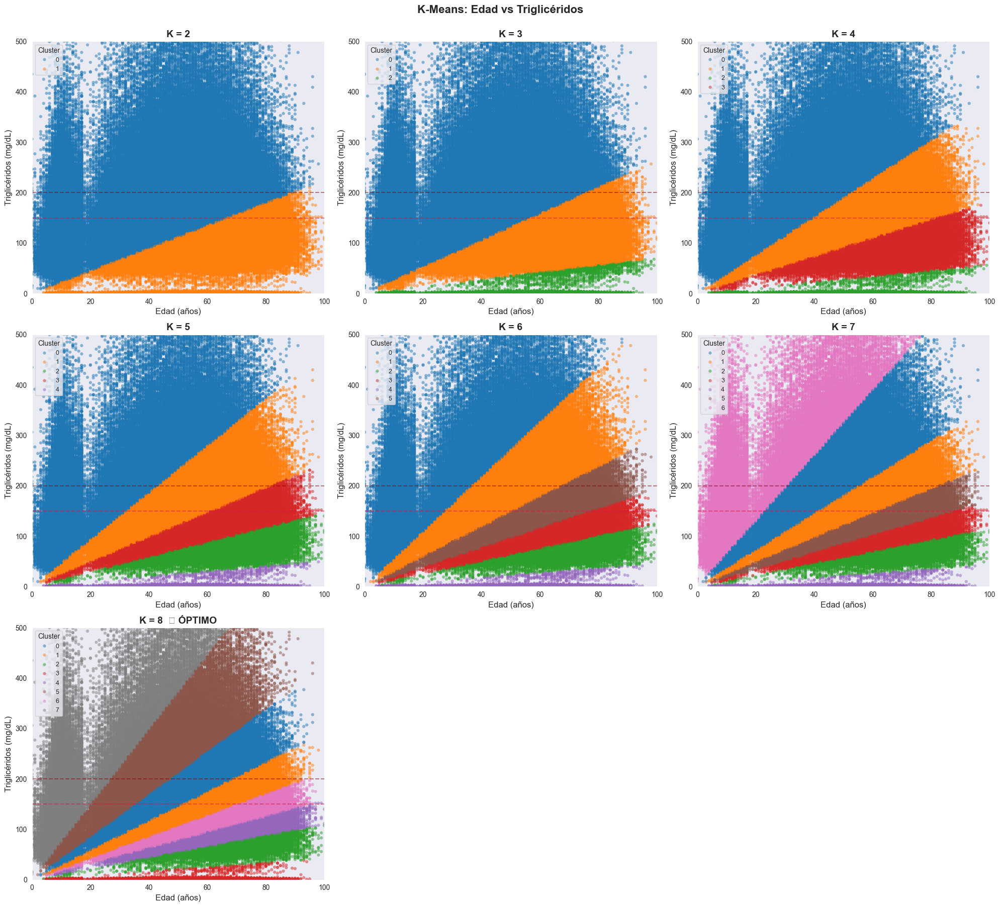

In [ ]:
fig, axes = plot_cluster_scatterplots(
    df=df_ml,
    fits=fits_age_tri,
    K_range=K_range_age_tri,
    x_col="edad_paciente",
    y_col="tri",
    best_k=best_k_ch_tri,
    x_label="Edad (años)",
    y_label="Triglicéridos (mg/dL)",
    title="K-Means: Edad vs Triglicéridos",
    x_lim=(0, 100),
    y_lim=(0, 500),
    clinical_thresholds=[
        {"value": 150, "color": "crimson", "alpha": 0.5, "label": "Límite normal"},
        {"value": 200, "color": "darkred", "alpha": 0.5, "label": "Alto"},
        {"value": 500, "color": "darkred", "alpha": 0.3, "label": "Muy alto"},
    ],
)
plt.savefig("../images/clusters_age_triglycerides.png", dpi=150, bbox_inches="tight")
plt.show()

In [32]:
optimal_k_age_tri = best_k_ch_tri
model_optimal_age_tri = fits_age_tri[best_k_ch_tri - 2]

df_age_tri_analysis = df_ml[["edad_paciente", "tri"]].copy()
df_age_tri_analysis["cluster"] = model_optimal_age_tri.labels_

cluster_stats_age_tri = (
    df_age_tri_analysis.groupby("cluster")
    .agg({"edad_paciente": ["mean", "std", "count"], "tri": ["mean", "std"]})
    .round(2)
)

print(f"Características de los {optimal_k_age_tri} clusters (Edad-Triglicéridos):")
print(cluster_stats_age_tri)
print("\n" + "=" * 60)

for cluster_id in sorted(df_age_tri_analysis["cluster"].unique()):
    cluster_data = df_age_tri_analysis[df_age_tri_analysis["cluster"] == cluster_id]
    edad_mean = cluster_data["edad_paciente"].mean()
    tri_mean = cluster_data["tri"].mean()
    n = len(cluster_data)

    if tri_mean < 150:
        tri_status = "normal"
    elif tri_mean < 200:
        tri_status = "límite alto"
    elif tri_mean < 500:
        tri_status = "alto"
    else:
        tri_status = "muy alto"

    print(f"\nCluster {cluster_id} (n={n:,}):")
    print(f"  - Edad promedio: {edad_mean:.1f} años")
    print(f"  - Triglicéridos promedio: {tri_mean:.1f} mg/dL ({tri_status})")

Características de los 8 clusters (Edad-Triglicéridos):
        edad_paciente                   tri        
                 mean    std  count    mean     std
cluster                                            
0               50.92  14.63  58158  177.45   52.56
1               56.70  13.59  52800  141.73   35.22
2               70.75  12.52   9592   63.55   15.02
3               52.41  19.46   4183    3.34    5.17
4               65.91  12.79  25386   89.08   18.75
5               39.73  17.72  54349  213.89   96.47
6               61.40  13.14  40388  113.74   25.58
7               17.76  14.75  50115  212.78  149.37


Cluster 0 (n=58,158):
  - Edad promedio: 50.9 años
  - Triglicéridos promedio: 177.4 mg/dL (límite alto)

Cluster 1 (n=52,800):
  - Edad promedio: 56.7 años
  - Triglicéridos promedio: 141.7 mg/dL (normal)

Cluster 2 (n=9,592):
  - Edad promedio: 70.8 años
  - Triglicéridos promedio: 63.5 mg/dL (normal)

Cluster 3 (n=4,183):
  - Edad promedio: 52.4 años
  - Triglicéri

## Conclusiones

### 1. Heterogeneidad de Perfiles Metabólicos en Población con Obesidad

El análisis K-means 5D (triglicéridos, glucosa, edad, latitud, longitud) sobre 294,971 registros reveló complejidad estructural en el fenotipo metabólico. Las métricas de validación no convergieron en un único K óptimo: Calinski-Harabasz favorece K=2, Davies-Bouldin indica K=8, mientras el método del codo (WCSS, por inspección visual) sugiere K=4-5 como óptimo. Este desacuerdo refleja la naturaleza multidimensional de las alteraciones metabólicas en obesidad, donde coexisten perfiles de riesgo discretos y gradientes continuos de severidad.

### 2. Estratificación Edad-Glucosa: Discordancia Metodológica

El clustering bidimensional Edad vs Glucosa mostró discordancia entre métricas:

- **Calinski-Harabasz**: K=8 (óptimo)
- **Davies-Bouldin**: K=4 (óptimo)
- **WCSS (método del codo)**: K=4 (por inspección visual)

El consenso entre Davies-Bouldin y el método del codo sugiere **K=4 como óptimo**, capturando cuatro perfiles etario-glucémicos principales sin sobresegmentación.

### 3. Dislipidemia por Edad: Estructura Tripartita

El análisis Edad vs Triglicéridos reveló convergencia metodológica parcial:

- **Davies-Bouldin**: K=5
- **Calinski-Harabasz**: K=8
- **WCSS (método del codo)**: K=3 (por inspección visual)

El método del codo indica **K=3 como estructura principal**, identificando tres grupos etarios con perfiles lipídicos diferenciados. Valores mayores (K=5-8) representan subsegmentaciones granulares dentro de estos tres perfiles base.

### 4. Variabilidad Geográfica de Factores Metabólicos

Los mapas coropléticos departamentales revelaron heterogeneidad espacial en triglicéridos y glucosa promedio entre regiones del Perú. La agregación geográfica de valores elevados podría reflejar determinantes socioeconómicos, accesibilidad a servicios de salud, o patrones alimenticios regionales. Estos hallazgos permiten focalización territorial de programas de intervención en obesidad y síndrome metabólico.

### 5. Consideraciones Metodológicas sobre Validación de Clusters

El desacuerdo sistemático entre métricas de validación es característico de datos clínicos con estructuras de clustering no esféricas y densidades variables:

- **Davies-Bouldin** (minimizar): Penaliza clusters con alta dispersión interna y baja separación. Favorece K intermedios.
- **Calinski-Harabasz** (maximizar): Favorece alta separación entre clusters. Tiende a sobreestimar K en datos con gradientes continuos.
- **WCSS (método del codo)**: Requiere inspección visual del punto de inflexión. Es el criterio más interpretable pero subjetivo.

Se recomienda:

- **Priorizar el método del codo** cuando hay punto de inflexión claro (como en este análisis).
- Usar Davies-Bouldin como criterio de desempate.
- Validar clínicamente mediante comparación con guías de práctica clínica (ADA, NCEP-ATP III).
- Considerar métodos de clustering jerárquico para visualizar estructura anidada.

### 6. Implicaciones para Análisis

El método del codo (WCSS) es más adecuado para determinar el número de clusters en este contexto clínico, resultando en:

- **5D**: K=4-5 perfiles metabólico-geográficos principales
- **Edad-Glucosa**: K=4 grupos etario-glucémicos
- **Edad-Triglicéridos**: K=3 perfiles etario-lipídicos base

Estas estructuras representan segmentaciones clínicamente interpretables, evitando sobresegmentación que dificulta la traducción a intervenciones de salud pública.
